<a href="https://colab.research.google.com/github/evk2103/fontanka_parsing/blob/main/EDA_NLP_bootcamp.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import re
from datetime import datetime, date, timedelta

import pandas as pd
import numpy as np

from tqdm.notebook import tqdm
import time

import matplotlib.pyplot as plt
import seaborn as sns

from wordcloud import WordCloud, STOPWORDS

import nltk
from nltk.corpus import stopwords
nltk.download("stopwords")

sns.set(style="darkgrid")
%matplotlib inline

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [2]:
df = pd.read_csv('/content/drive/MyDrive/Data/fontanka_full.csv')

In [3]:
# посмотрим на данные
df

,url,title,timestamp,comments,topic,views,content
0,https://www.fontanka.ru/2023/01/01/71948327/,"Новый, 2023 год наступил в Петербурге",2023-01-01 00:01:00,34,Город,47592.0,"В Петербург пришел новый, 2023 год. Горожане и..."
1,https://www.fontanka.ru/2023/01/01/71948357/,Три! Два! Один! Шанхай — вери гуд! Как в Петер...,2023-01-01 01:13:00,19,Город,17156.0,Фото: Андрей Бок/«Фонтанка.ру»ПоделитьсяНа Дво...
2,https://www.fontanka.ru/2023/01/01/71948360/,В центре Петербурга жесткие задержания. Полици...,2023-01-01 01:54:00,132,Город,121683.0,"Корреспондент «Фонтанки» рассказывает, что в п..."
3,https://www.fontanka.ru/2022/12/30/71943812/,«Чебурашка» выходит в прокат,2023-01-01 04:00:00,0,Афиша Plus,42212.0,Фото: кадр из фильмаПоделитьсяВ первый день 20...
4,https://www.fontanka.ru/2023/01/01/71948165/,"Обобщить, объединить и упростить. Что придумал...",2023-01-01 10:00:00,27,Общество,19661.0,"Фото: Юрий Смитюк/ТАССПоделитьсяРяд законов, к..."
...,...,...,...,...,...,...,...
25023,https://doctorpiter.ru/obraz-zhizni/eti-privyc...,"Эти привычки губят наши суставы, среди них — н...",2023-10-16 22:53:00,0,Доктор Питер,NaN,NaN
25024,https://www.fontanka.ru/2023/10/16/72816851/,Япония призвала Россию снять «несправедливые о...,2023-10-16 23:08:00,58,Власть,15294.0,Министерство иностранных дел Японии призвало Р...
25025,https://www.fontanka.ru/2023/10/16/72816866/,Два болельщика сборной Швеции по футболу застр...,2023-10-16 23:13:00,77,Происшествия,6481.0,"В Брюсселе, где сегодня проходит матч отборочн..."
25026,https://www.fontanka.ru/2023/10/16/72815813/,В Ленинградском зоопарке крокодил Тотоша вынуж...,2023-10-16 23:23:00,20,Общество,29551.0,"Ленинградский зоопарк показал, как обедает их ..."


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25028 entries, 0 to 25027
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   url        25028 non-null  object 
 1   title      25028 non-null  object 
 2   timestamp  25028 non-null  object 
 3   comments   25028 non-null  int64  
 4   topic      25028 non-null  object 
 5   views      22772 non-null  float64
 6   content    22772 non-null  object 
dtypes: float64(1), int64(1), object(5)
memory usage: 1.3+ MB


В колонках views и content есть пропуски, посмотрим на них.

In [6]:
df[pd.isna(df.views)]

,url,title,timestamp,comments,topic,views,content
11,https://doctorpiter.ru/zdorove/doedalkin-den-s...,«Доедалкин день»: сколько можно хранить салаты...,2023-01-01 11:52:00,0,Доктор Питер,NaN,NaN
17,https://doctorpiter.ru/zdorove/immunolog-parec...,"Иммунолог объяснила, как новогодние праздники ...",2023-01-01 13:32:00,0,Доктор Питер,NaN,NaN
31,https://doctorpiter.ru/zdorove/takogo-doktora-...,"Такого доктора лучше не слушать: 10 признаков,...",2023-01-01 16:30:00,0,Доктор Питер,NaN,NaN
39,https://www.fontanka.ru/longreads/71928716/,"Наш проект: Русское шоу, вкусный ужин и танцы:...",2023-01-01 18:00:00,0,Общество,NaN,NaN
42,https://doctorpiter.ru/obraz-zhizni/dietolog-t...,"Диетолог назвала продукты, которые помогут изб...",2023-01-01 18:42:00,0,Доктор Питер,NaN,NaN
...,...,...,...,...,...,...,...
24988,https://doctorpiter.ru/obraz-zhizni/test-iq-ne...,"Тест IQ не поможет: 5 признаков, которые легко...",2023-10-16 17:24:00,0,Доктор Питер,NaN,NaN
25005,https://doctorpiter.ru/obraz-zhizni/lichnyi-op...,"Генетик рассказал о привычках, которые помогли...",2023-10-16 19:18:00,0,Доктор Питер,NaN,NaN
25019,https://doctorpiter.ru/zdorove/10-samykh-opasn...,10 самых опасных осложнений ОРВИ. Как их распо...,2023-10-16 21:57:00,0,Доктор Питер,NaN,NaN
25023,https://doctorpiter.ru/obraz-zhizni/eti-privyc...,"Эти привычки губят наши суставы, среди них — н...",2023-10-16 22:53:00,0,Доктор Питер,NaN,NaN


Пропуски образовались по той причине, что url ведут на сторонние сайты, парсинг для которых не делался. Посмотрим на распределение пропусков по категориям новостей.

In [7]:
df_topic = df.topic.value_counts().to_frame().reset_index()
df_topic = df_topic.merge(df[pd.isna(df['views'])].topic.value_counts().to_frame().reset_index(), on='index')
df_topic.columns = ['topic', 'full', 'nan']
df_topic['not_nan'] = df_topic.full - df_topic.nan
df_topic

,topic,full,nan,not_nan
0,Происшествия,6890,19,6871
1,Общество,6324,239,6085
2,Город,3151,59,3092
3,Доктор Питер,1812,1806,6
4,Афиша Plus,1122,2,1120
5,Власть,1049,2,1047
6,Строительство,896,5,891
7,Спорт,688,2,686
8,Бизнес,652,19,633
9,Образ жизни,359,25,334


Максимальное количество пропусков в категории "Доктор Питер". На данном этапе мы не будем выкачивать данные со сторонних сайтов, просто удалим пропуски. После удаления пропусков останется еще достаточное количество данных.

In [8]:
df.dropna(inplace=True)

In [9]:
# переведем 'views' в формат integer, а 'timestamp' в datetime
df['views'] = df.views.astype(int)
df['timestamp'] = pd.to_datetime(df.timestamp)

# EDA

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 22772 entries, 0 to 25026
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   url        22772 non-null  object        
 1   title      22772 non-null  object        
 2   timestamp  22772 non-null  datetime64[ns]
 3   comments   22772 non-null  int64         
 4   topic      22772 non-null  object        
 5   views      22772 non-null  int64         
 6   content    22772 non-null  object        
dtypes: datetime64[ns](1), int64(2), object(4)
memory usage: 1.4+ MB


In [12]:
df.topic.value_counts()

Происшествия               6871
Общество                   6085
Город                      3092
Афиша Plus                 1120
Власть                     1047
Строительство               891
Спорт                       686
Бизнес                      633
Политика                    355
Финансы                     347
Образ жизни                 334
Авто                        308
Спецоперация на Украине     225
Технологии                  207
Недвижимость                156
Туризм                      141
Доброе дело                 133
Особое мнение                55
ЖКХ                          23
Финляндия                    21
Работа                       15
Бизнес-трибуна               12
Новости компаний              9
Доктор Питер                  6
Name: topic, dtype: int64

Всего в нашей выборке 22772 строки. Распределение по категориям новостей несбалансированное.

Рассмотрим распределение новостей по годам, месяцам и дням недели. Для этого создадим дополнительные временные признаки.

In [14]:
df['year'] = pd.DatetimeIndex(df['timestamp']).year
df['month'] = pd.DatetimeIndex(df['timestamp']).month
df['weekday'] = pd.DatetimeIndex(df['timestamp']).weekday

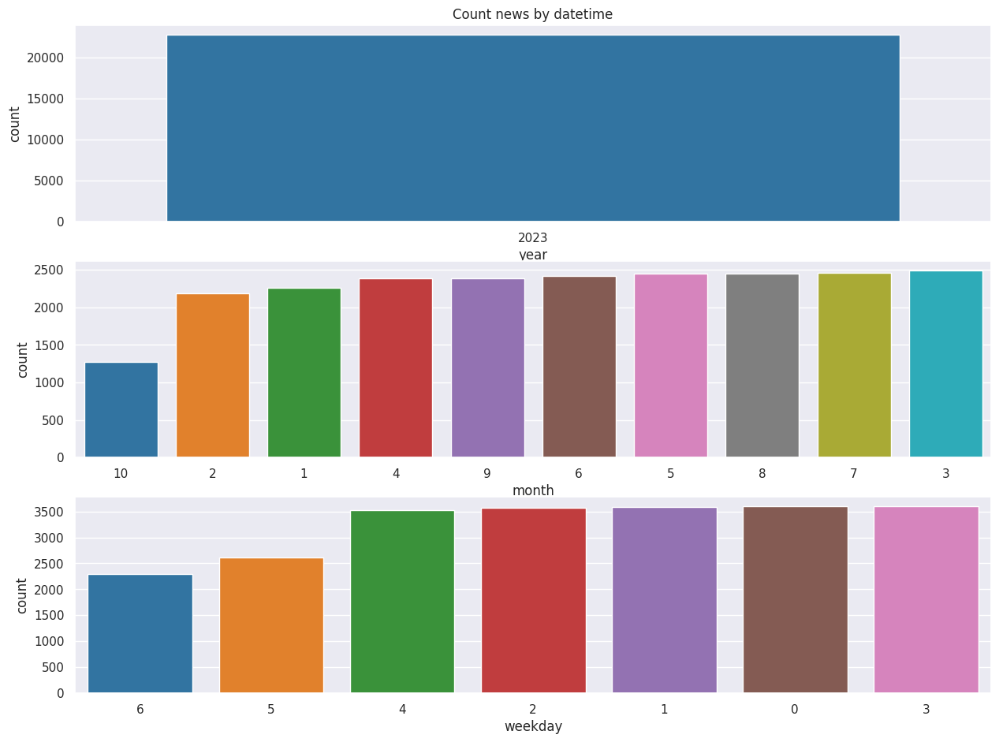

In [27]:
fig, axs = plt.subplots(3, 1, figsize=(15, 11), dpi=100)
for ind, col in enumerate(['year', 'month', 'weekday']):
    sns.countplot(x=df[col], palette='tab10', ax=axs[ind], order=df[col].value_counts(ascending=True).index)
axs[0].set_title('Count news by datetime');

Из графика видно, что все новости у нас за 2023 год, что очевидно, ведь только 2023 год мы и закачивали.

Распределение количества новостей по месяцам практически на одном уровне, только за январь и февраль их несущественно меньше, что можно объяснить длинными январскими праздниками, а февраль - коротким месяцем. В октябре новостей вдвое меньше, т.к. месяц неполный: данные закачивались по 16.10.2023.

Из распределения по дням недели видно, что по будням новостей примерно одинаковое количество, а в выходные примерно в 1.5 раз меньше.

Посмотрим на распределение числа просмотров.

<ipython-input-28-10b41f2ab2e5>:2: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(df.topic, rotation = 45)


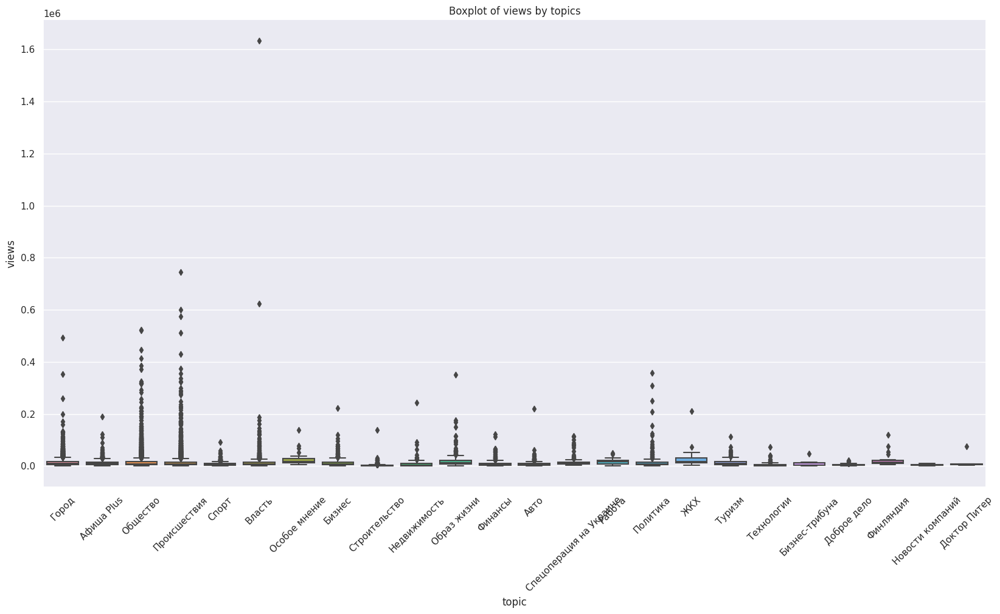

In [28]:
fig, ax = plt.subplots(1, 1, figsize=(20, 10), dpi=100)
ax.set_xticklabels(df.topic, rotation = 45)
sns.boxplot(x="topic", y="views", data=df, ax=ax)
plt.title('Boxplot of views by topics');

из графика видо, что по просторам есть длинные хвосты, а по категории "Власть" сильно выбиваются отдельные точки - претенденты на выбросы. Однако, сразу нужно отметить, что количество просмотров также зависит от возраста статьи, поэтому зависимость популярности от количества просмотров имеет не линейную, а более сложную зависимость.


<ipython-input-33-7a4dda702686>:2: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(df.topic, rotation = 45)


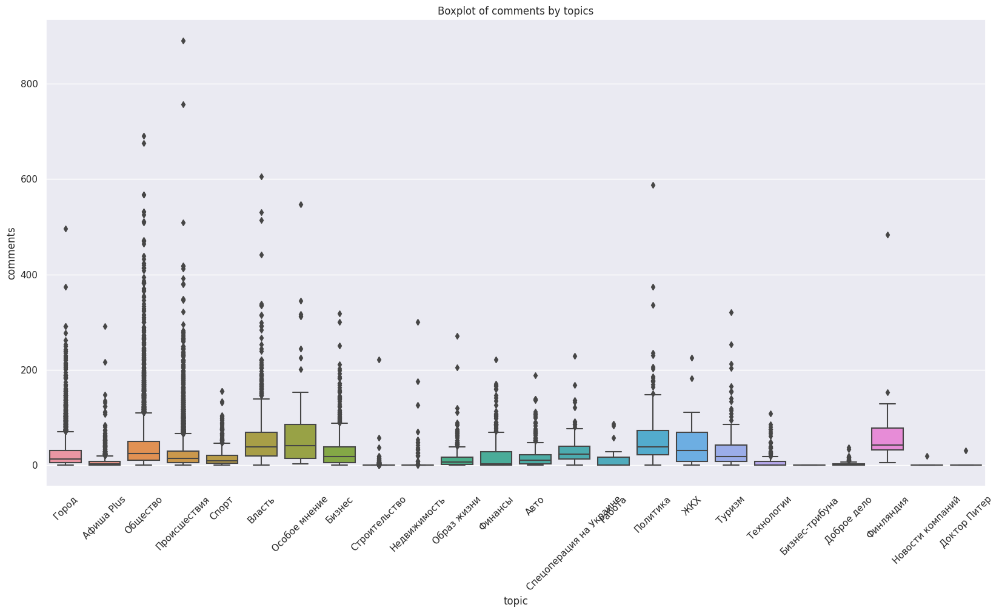

In [33]:
fig, ax = plt.subplots(1, 1, figsize=(20, 10), dpi=100)
ax.set_xticklabels(df.topic, rotation = 45)
sns.boxplot(x="topic", y="comments", data=df, ax=ax)
plt.title('Boxplot of comments by topics');

По распределению количества комметнариев можно сделать такие же выводы как по просмотрам.

Рассмотрим в целом на распределение количества просмотров и комментариев по всем данным.

<ipython-input-31-d252bbc51457>:4: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(


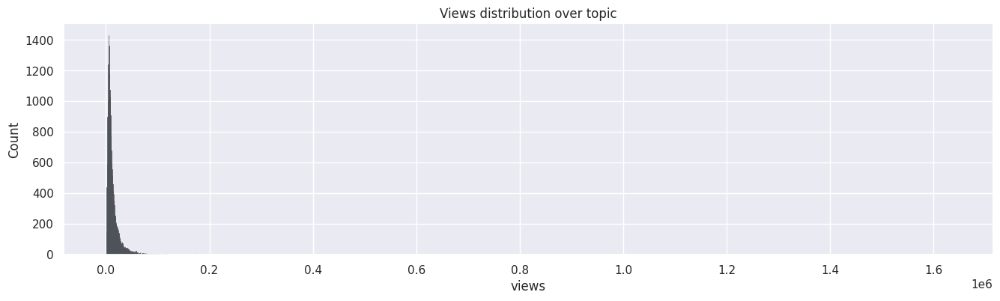

In [31]:
fig, axs = plt.subplots(1, 1, figsize=(16, 4), dpi=100)
sns.despine(fig)

sns.histplot(
    df,
    x="views",
    edgecolor=".3",
    palette="coolwarm",
    linewidth=.5,
);
axs.set_title('Views distribution over topic');

<ipython-input-34-a72dec7e4148>:4: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(


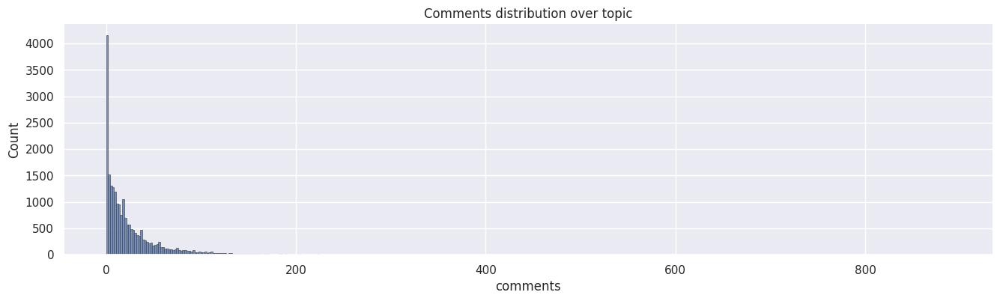

In [34]:
fig, axs = plt.subplots(1, 1, figsize=(16, 4), dpi=100)
sns.despine(fig)

sns.histplot(
    df,
    x="comments",
    edgecolor=".3",
    palette="coolwarm",
    linewidth=.5,
);
axs.set_title('Comments distribution over topic');



У распределения количества просмотров и комментариев есть далекие выбросы. Более того, форма распределения очень похожа на логнормальное распределение. Поэтому добавим еще один признак - логарифм количества просмотров и логарифм количества комментариев, сдвинутого на единицу, поскольку количество просмотров и количество комментариев может принимать значение ноль.

На графике просмотров по оси абсцисс отложен log1p количества просмотров, а по оси ординат - количество статей разных тематик, имеющих такое количество просмотров. Видно, что теперь распределение имеет форму, близкую к нормальному распределению, хоть оно немного скошено вправо и имеет отрицательный коэффициент асимметрии (skewness).

По количеству комментариев график не стал походить на нормальное распределение, даже после логорифмирования. Очень много статей не имеют комментариев.

In [40]:
df['log_views'] = np.log1p(df['views'])
df['log_comments'] = np.log1p(df['comments'])

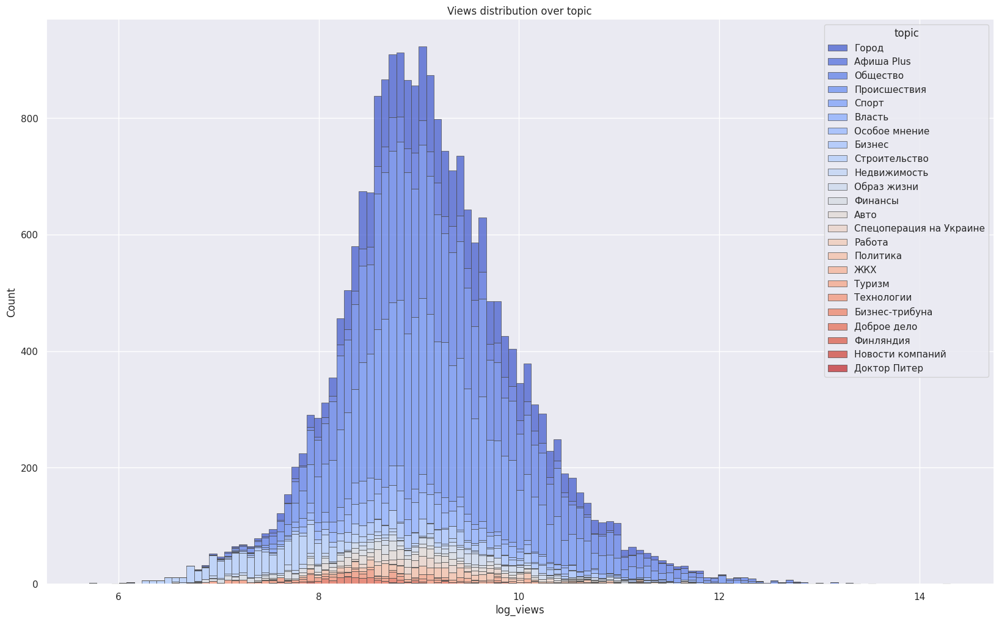

In [36]:
fig, axs = plt.subplots(1, 1, figsize=(20, 12), dpi=100)
sns.despine(fig)

sns.histplot(
    df,
    x="log_views",
    hue="topic",
    multiple="stack",
    edgecolor=".3",
    palette="coolwarm",
    linewidth=.5,
);
axs.set_title('Views distribution over topic');

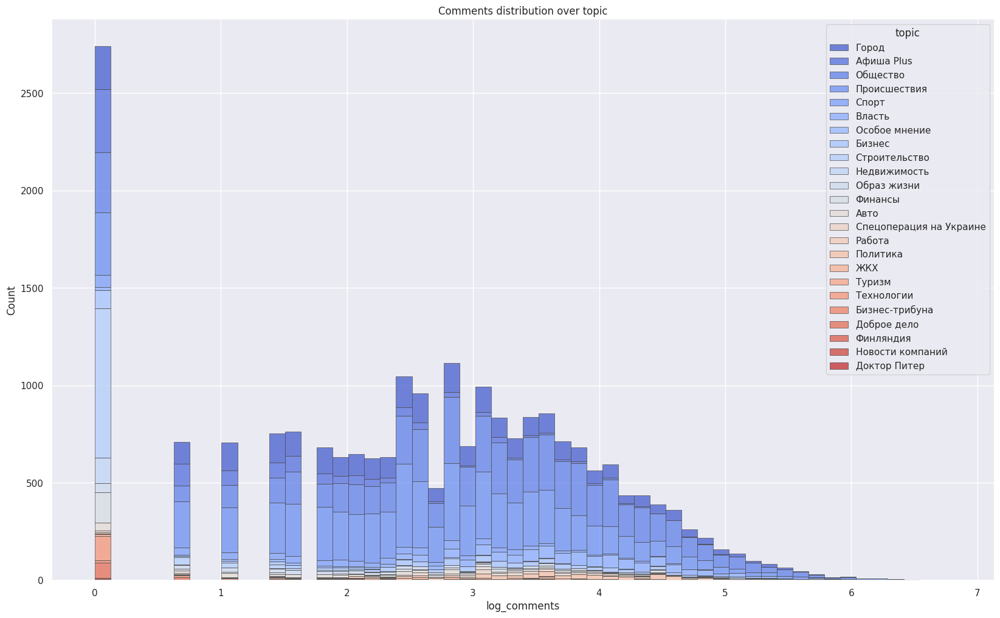

In [41]:
fig, axs = plt.subplots(1, 1, figsize=(20, 12), dpi=100)
sns.despine(fig)

sns.histplot(
    df,
    x="log_comments",
    hue="topic",
    multiple="stack",
    edgecolor=".3",
    palette="coolwarm",
    linewidth=.5,
);
axs.set_title('Comments distribution over topic');

Воспользуемся критерием Манна-Уитни, чтобы проверить, насколько распределение просмотров близко к логнормальному.

In [42]:
from scipy.stats import mannwhitneyu

# Генерируем выборку из нормального распределения с таким же мат. ожиданием и дисперсией, как у нашей переменной
x = np.random.normal(loc=df['log_views'].mean(), scale=df['log_views'].std(), size=100000)

# Проводим тест Манна-Уитни и получаем p-значимость
U1, p = mannwhitneyu(x, df['log_views'])

print('P-значимость:', p)

# Возьмем границу принятия решения 1%
if p < 0.01:
    print('Распределение количества просмотров можно считать логнормальным')
else:
    print('Распределение количества просмотров нельзя считать логнормальным')

P-значимость: 5.93904145957742e-05
Распределение количества просмотров можно считать логнормальным


Посчитаем длину заголовка и длину текста по каждой строке. И посмотрим на графике как выглядит распределение по категориям новостей

In [43]:
df['len_title'] = df['title'].str.len()
df['len_content'] = df['content'].str.len()

<ipython-input-45-aaa8837a4c4f>:3: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(df.topic, rotation = 45)
<ipython-input-45-aaa8837a4c4f>:3: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(df.topic, rotation = 45)


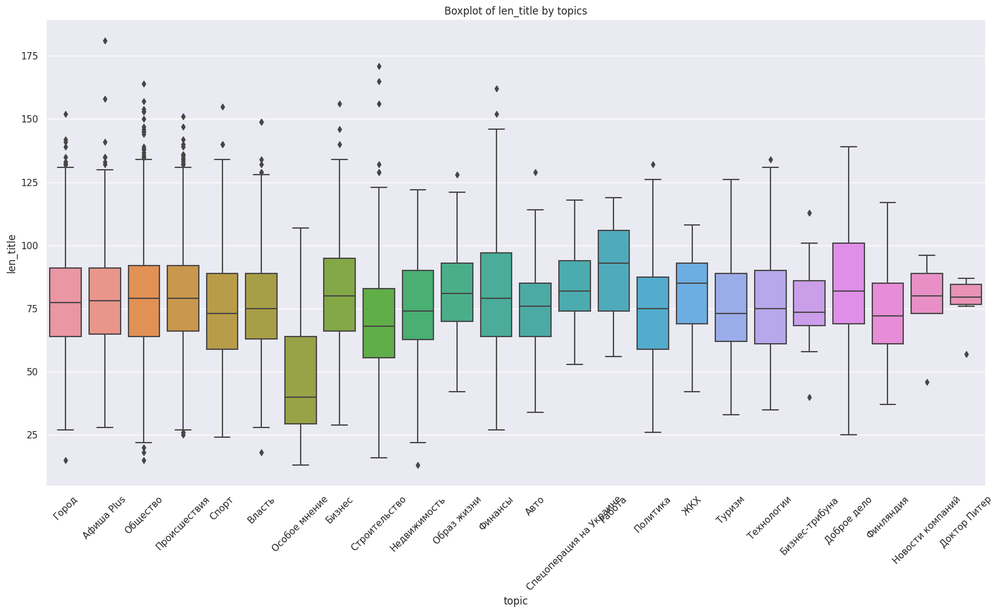

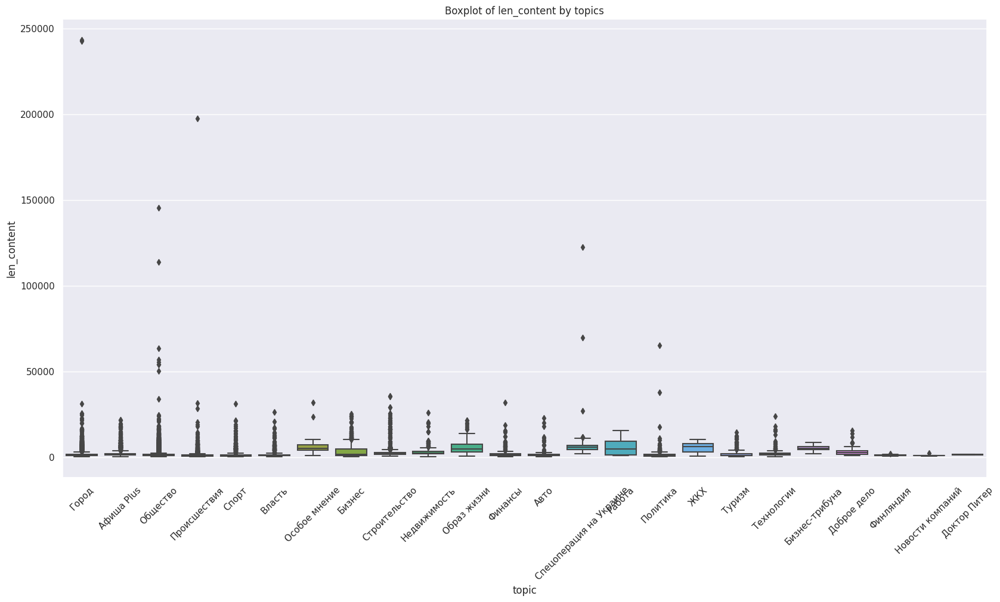

In [45]:
for col in ['len_title', 'len_content']:
    fig, ax = plt.subplots(1, 1, figsize=(20, 10), dpi=100)
    ax.set_xticklabels(df.topic, rotation = 45)
    sns.boxplot(x="topic", y=col, data=df, ax=ax)
    plt.title(f'Boxplot of {col} by topics');

По графику видно, что длина заголовка в среднем одинакова по всем категориям и примерно равна 75 символам. Выбивается только категория "Особое мнение" со средней длиной загоровка в районе 37 символов.

Длина основного текста имеет тяжелые хвосты по категориям Город, Происшествия, Общество, Спецоперация на Украине.

Посмотрим, какие ключевые слова чаще всего встречаются в статьях каждой тематики. Одной из гипотез является то, что статьи разных, но при этом близких тематик с одинаковыми ключевыми словами могут вносить негативный вклад в работу модели.

In [46]:
stop_words = stopwords.words('russian')
stop_words.extend(['что', 'это', 'так',
                    'вот', 'быть', 'как',
                    'в', '—', 'к', 'за', 'из', 'из-за',
                    'на', 'ок', 'кстати',
                    'который', 'мочь', 'весь',
                    'еще', 'также', 'свой',
                    'ещё', 'самый', 'ул', 'комментарий',
                    'английский', 'язык'])

<ipython-input-47-b495b6fa96a1>:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1, 1, figsize=(16, 8))


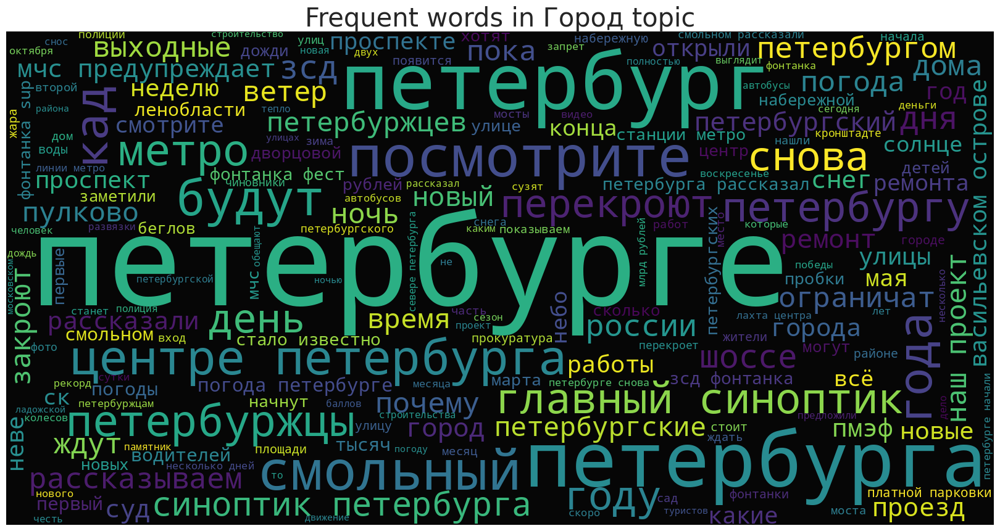

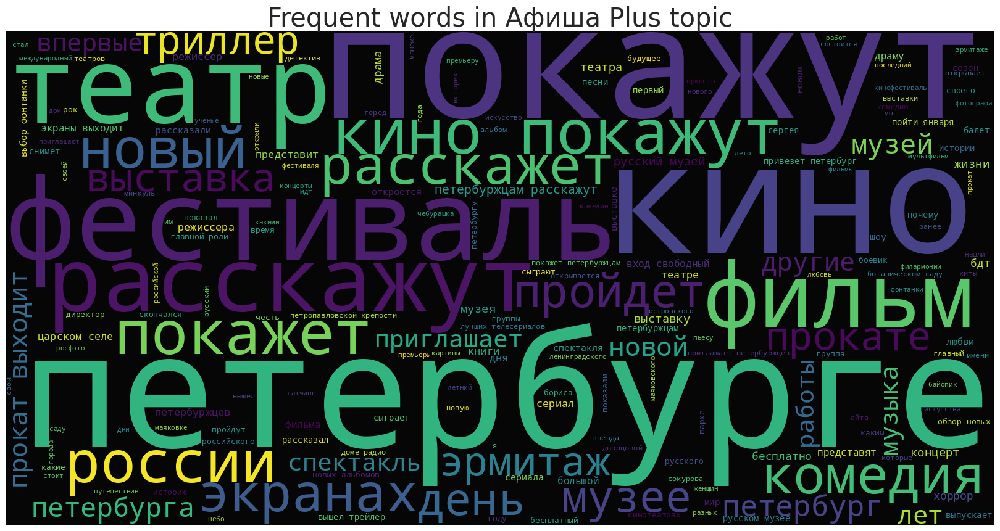

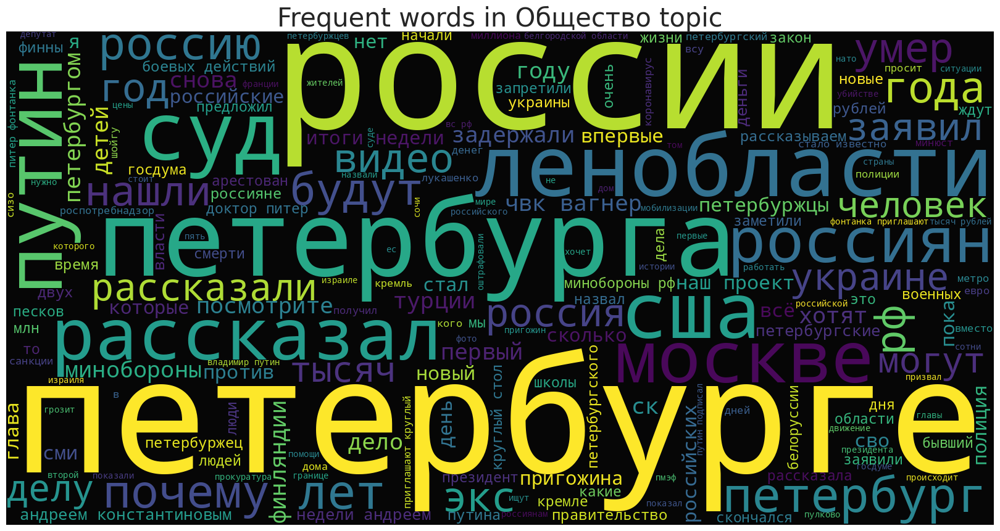

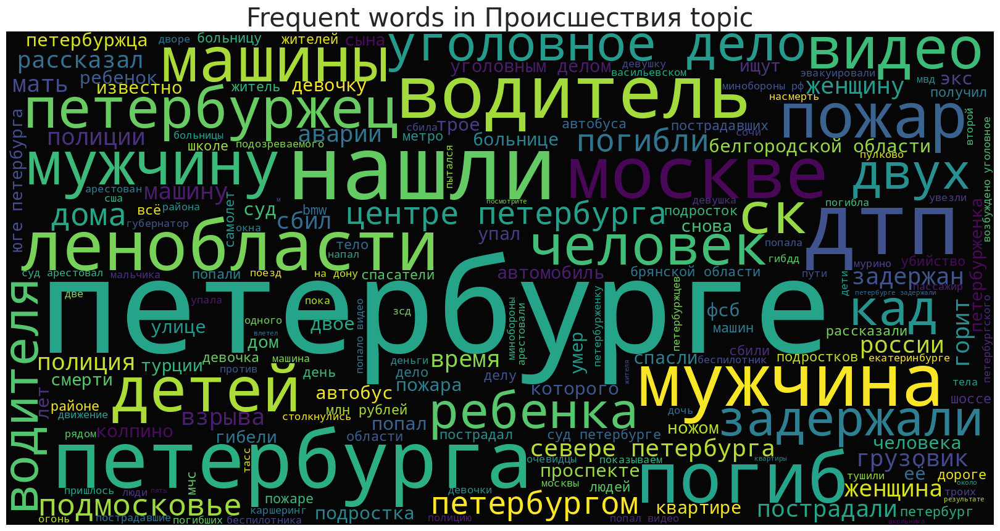

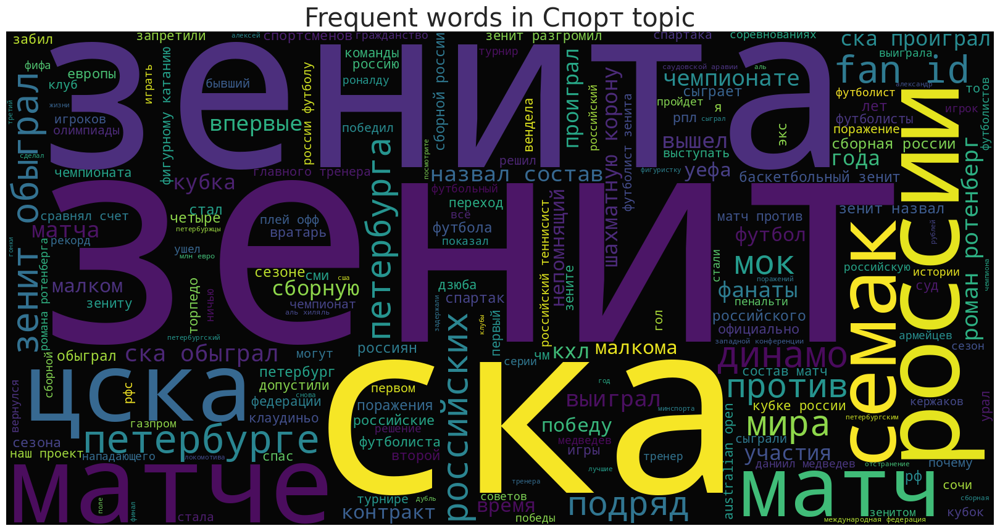

...

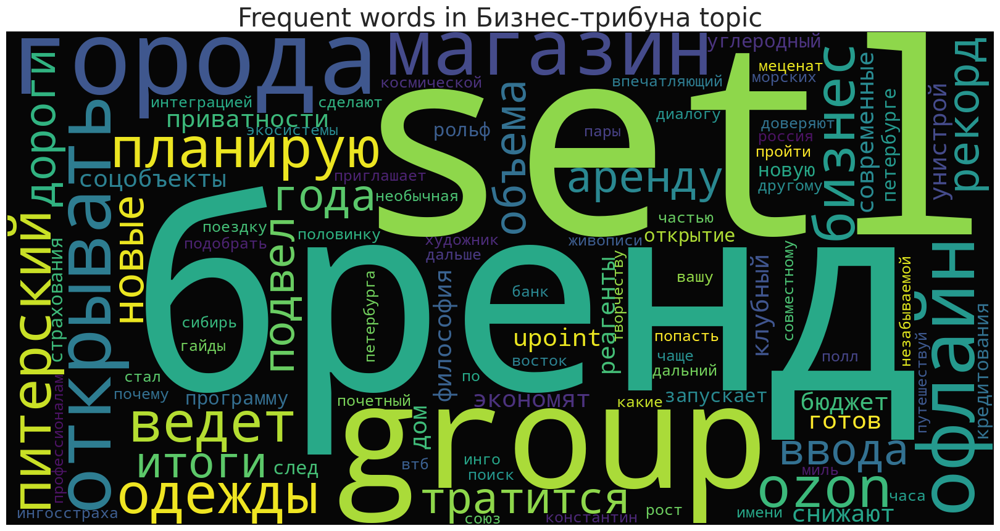

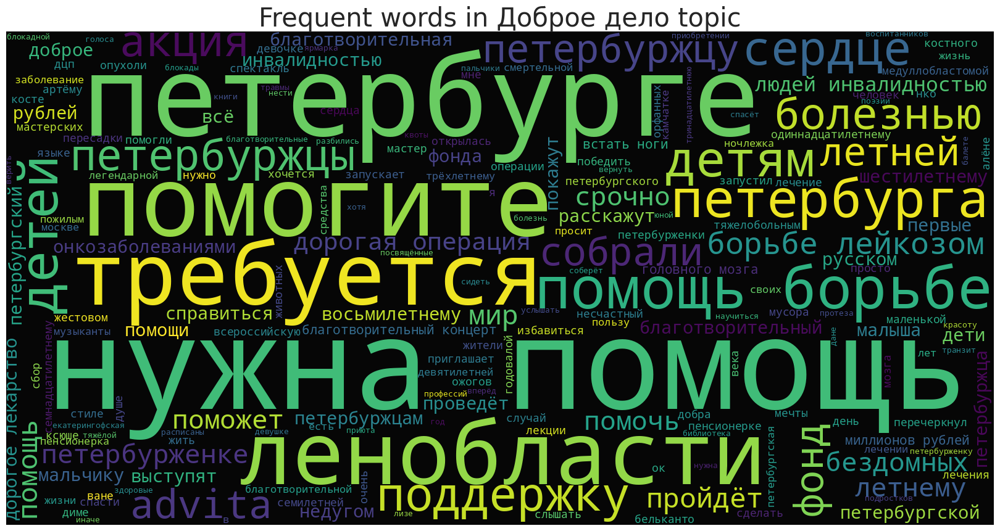

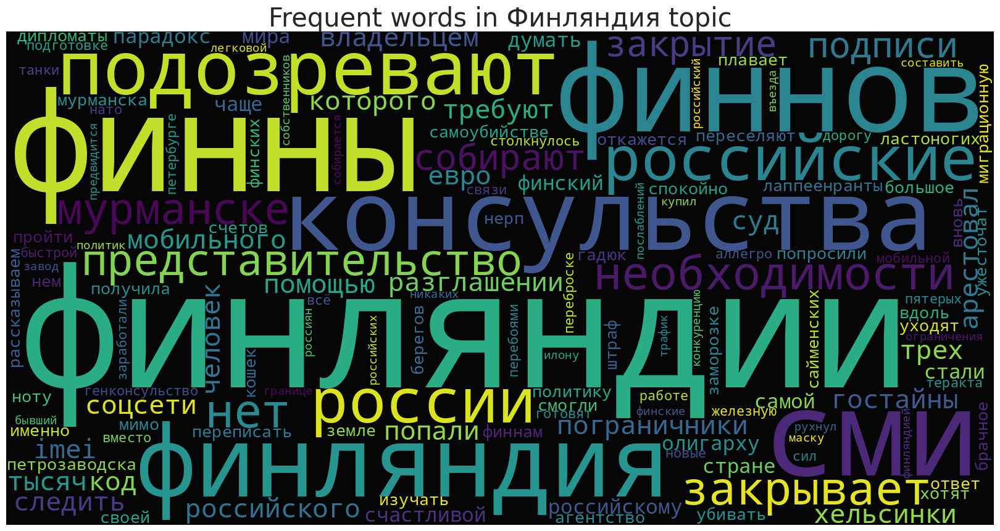

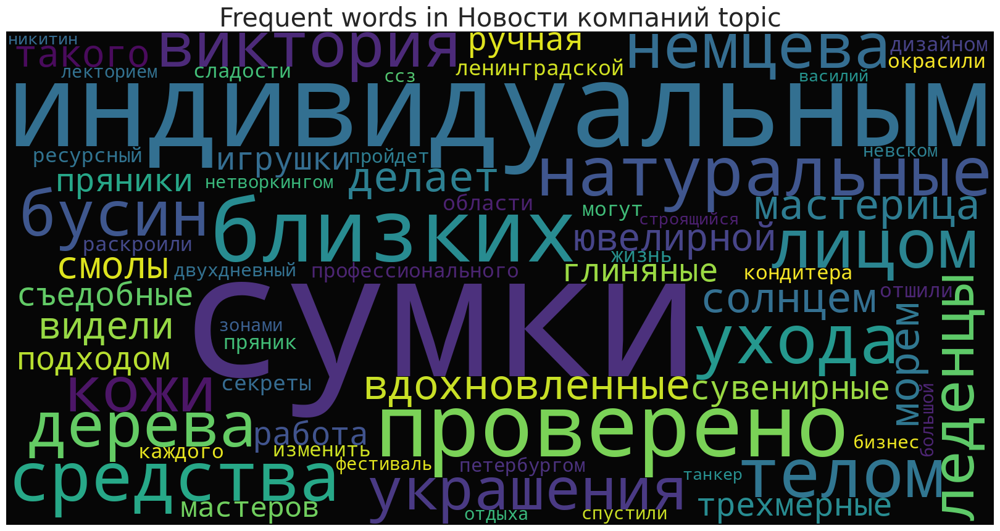

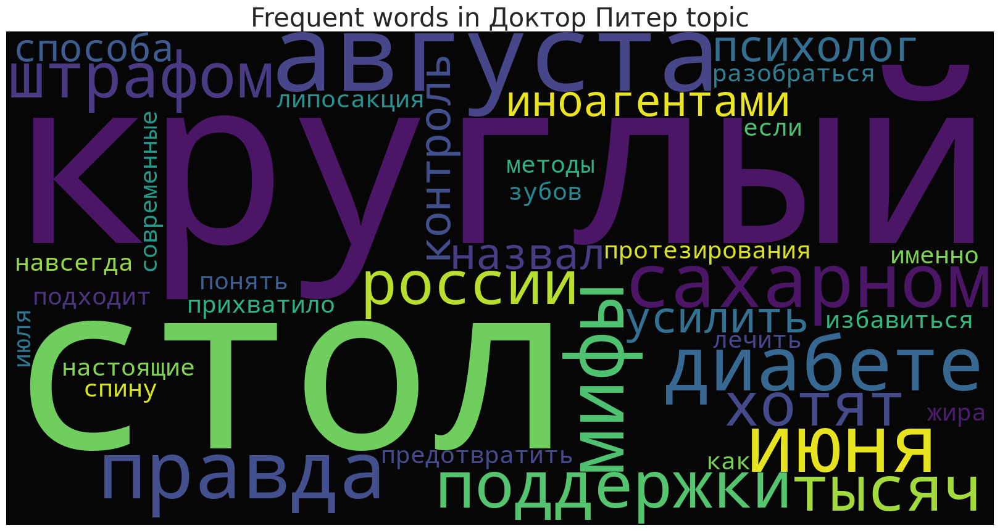

In [47]:
for topic in df.topic.unique():
    words = df[df.topic == topic].title.str.split(' ').explode().values
    words = [word.lower() for word in words if word.lower() not in stop_words]

    wc = WordCloud(background_color="black", width=1600, height=800)
    wc.generate(" ".join(words))

    fig, ax = plt.subplots(1, 1, figsize=(16, 8))
    plt.axis("off")
    plt.tight_layout(pad=0)
    ax.set_title(f"Frequent words in {topic} topic", fontsize=30)
    ax.imshow(wc, alpha=0.98)

Ожидаемо во многих категориях в списке ключевых слов оказались разные формы слова Петербург. Вероятно, стоит добавить все формы этого слова в список стоп-слов

На данный момент мы выкачиваем статьи в обратном хронологическом порядке. Это значит, что в выборку попадают, как старые, так и совершенно новые статьи. Это сильно влияет на один из признаков - количество просмотров. Поэтому для корректной работы модели необходимо будет каким-то образом отнормировать этот признак. Для этого сначала посмотрим распределение возраста статей, а затем распределение отношения количества просмотров к возрасту статьи. Это будет не столь корректной оценкой, потому что количество просмотров со временем растет нелинейно. Скорее всего, эта зависимость имеет экспоненциальный характер с некоторой линией насыщения - асимптотой. Но для нулевого приближения попробуем сначала рассмотреть самый простой вариант.

In [50]:
df['lifetime'] = df['timestamp'].apply(lambda x: (datetime.now() - x).total_seconds())
df['lifetime'] = df['lifetime'].apply(lambda x: divmod(x, 60)[0]) # lifetime in minutes

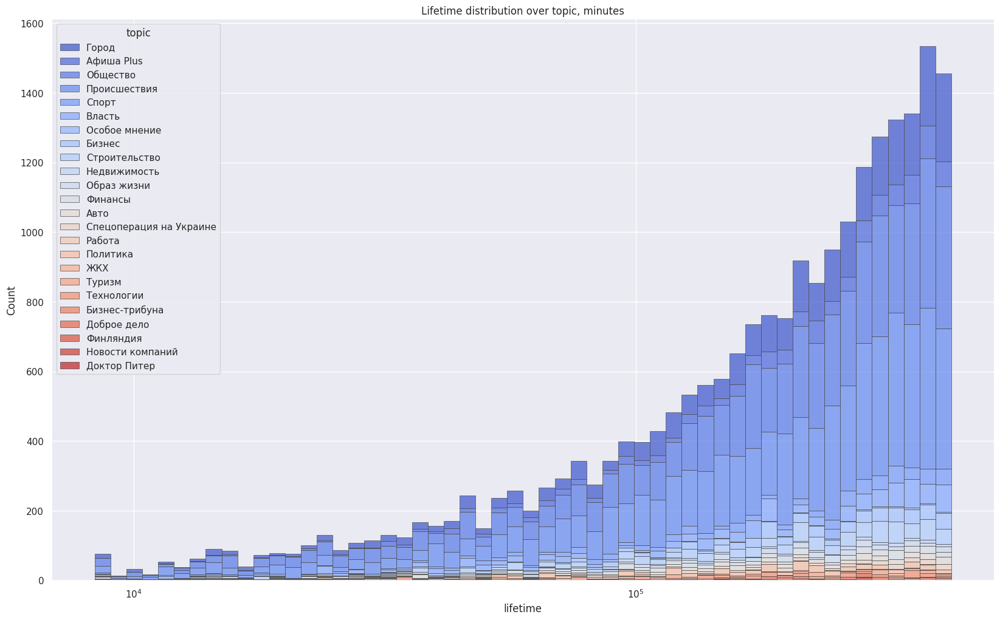

In [51]:
fig, axs = plt.subplots(1, 1, figsize=(20, 12), dpi=100)
sns.despine(fig)

sns.histplot(
    df,
    x="lifetime",
    hue="topic",
    multiple="stack",
    edgecolor=".3",
    palette="coolwarm",
    linewidth=.5,
    log_scale=True,
);
axs.set_title('Lifetime distribution over topic, minutes');

Как и ожидалось, в датасете присутствуют как старые статьи, так и новые.

In [56]:
df['views_by_minutes'] = (df['views'] + 1) / df['lifetime']
df['log_views_by_minutes'] = np.log1p(df['views_by_minutes'])

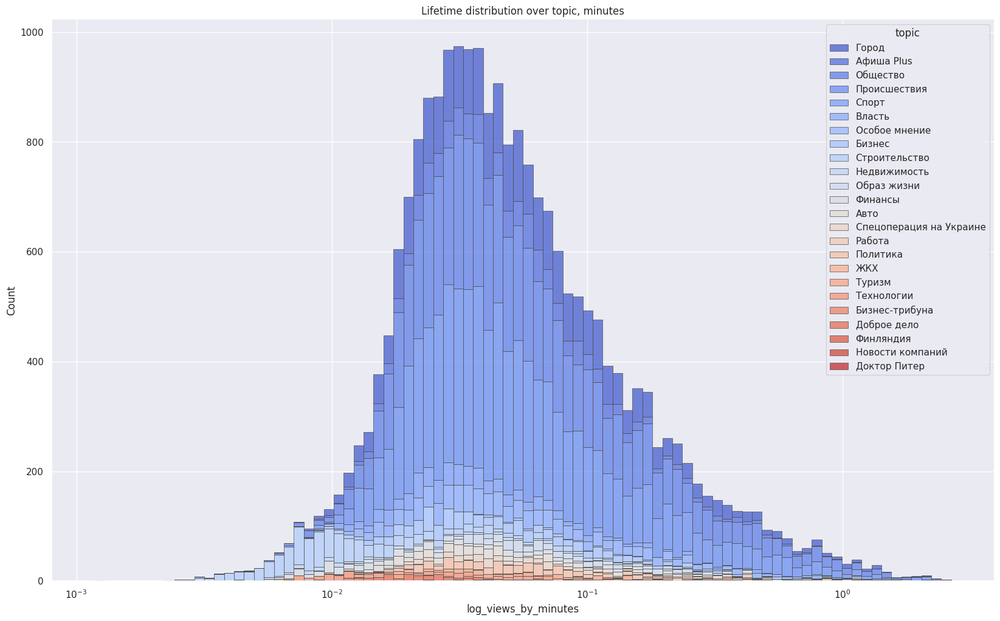

In [59]:
fig, axs = plt.subplots(1, 1, figsize=(20, 12), dpi=100)
sns.despine(fig)

sns.histplot(
    df,
    x="log_views_by_minutes",
    hue="topic",
    multiple="stack",
    edgecolor=".3",
    palette="coolwarm",
    linewidth=.5,
    log_scale=True,
);
axs.set_title('Lifetime distribution over topic, minutes');

Новый признак - количество просмотров в минуту, или средняя скорость роста количества просмотров, - имеет  распределение, близкое к логнормальному, и с таким признаком уже можно как-то работать.


**Выводы**

Итак, на данном этапе мы провели первичный анализ датасета. Статьи распределены по тематикам довольно неравномерно. Все новости относятся к 2023 году, по месяцам распределеение новостей равномерное, за исключением октября, т.к. выгрузка была за неполный месяц. По дням недели меньше всего новостей выходит в выходные, а по будням распределение равномерное.

В среднем длина заголовка по всем категориям около 75 символов, за исключением категории "Особое мнение" со средней длиной загоровка в районе 37 символов. Длина текста имеет тяжелые хвосты, особенно по категориям Город, Происшествия, Общество, Спецоперация на Украине.

Мы также проанализировали основные ключевые слова, которые наводят на гипотезу о том, что статьи разных тематик могут быть сильно похожи по доминирующим ключевым словам и тем самым негативно влиять на модель. Это нужно будет иметь в виду при построоении модели.

Одним из важных, на первый взгляд, признаков является количество просмотров, поскольку в каждый период времени наиболее популярными будут статьи на актуальные для данного промежутка времени темы. Однако, количество просмотров сильно зависит от возраста статьи, поэтому мы добавили новый признак - средняя скорость роста количества просмотров, - которая, как оказалось, имеет нормальное распределение, что мы проверили по критерию Манна-Уитни.

Поскольку мы работаем с текстами, на этом этапе пока не столь очевидно, какие данные и по какой причине стоит считать выбросами, а какие - особенностями конкретной тематики. Поэтому это мы оставим на следующие этапы работы над проектом.
